In [ ]:
import os
import numpy as np
from skimage import exposure, transform
from osgeo import gdal

In [ ]:
!unzip /content/jaipur15-22.zip

Archive:  /content/jaipur15-22.zip
   creating: rajasthan_coastline 2/
  inflating: __MACOSX/._rajasthan_coastline 2  
  inflating: rajasthan_coastline 2/rajasthan_nighttime_lights_2016_9.tif  
  inflating: __MACOSX/rajasthan_coastline 2/._rajasthan_nighttime_lights_2016_9.tif  
  inflating: rajasthan_coastline 2/rajasthan_nighttime_lights_2021_2.tif  
  inflating: __MACOSX/rajasthan_coastline 2/._rajasthan_nighttime_lights_2021_2.tif  
  inflating: rajasthan_coastline 2/rajasthan_nighttime_lights_2021_3.tif  
  inflating: __MACOSX/rajasthan_coastline 2/._rajasthan_nighttime_lights_2021_3.tif  
  inflating: rajasthan_coastline 2/rajasthan_nighttime_lights_2016_8.tif  
  inflating: __MACOSX/rajasthan_coastline 2/._rajasthan_nighttime_lights_2016_8.tif  
  inflating: rajasthan_coastline 2/rajasthan_nighttime_lights_2018_12.tif  
  inflating: __MACOSX/rajasthan_coastline 2/._rajasthan_nighttime_lights_2018_12.tif  
  inflating: rajasthan_coastline 2/rajasthan_nighttime_lights_2022_11.tif 

In [ ]:
!unzip /content/jaipur_images.zip

Archive:  /content/jaipur_images.zip
  inflating: rajasthan_coastline/rajasthan_nighttime_lights_2021_6.tif  
  inflating: rajasthan_coastline/rajasthan_nighttime_lights_2021_3.tif  
  inflating: rajasthan_coastline/rajasthan_nighttime_lights_2020_9.tif  
  inflating: rajasthan_coastline/rajasthan_nighttime_lights_2021_4.tif  
  inflating: rajasthan_coastline/rajasthan_nighttime_lights_2020_8.tif  
  inflating: rajasthan_coastline/rajasthan_nighttime_lights_2020_4.tif  
  inflating: rajasthan_coastline/rajasthan_nighttime_lights_2020_10.tif  
  inflating: rajasthan_coastline/rajasthan_nighttime_lights_2021_12.tif  
  inflating: rajasthan_coastline/rajasthan_nighttime_lights_2022_4.tif  
  inflating: rajasthan_coastline/rajasthan_nighttime_lights_2020_12.tif  
  inflating: rajasthan_coastline/rajasthan_nighttime_lights_2022_1.tif  
  inflating: rajasthan_coastline/rajasthan_nighttime_lights_2021_5.tif  
  inflating: rajasthan_coastline/rajasthan_nighttime_lights_2021_9.tif  
  inflating

In [ ]:
# Define the path to the directory containing the extracted data
data_dir = '/content/data1'

In [ ]:
# Define the dimensions of the images
img_height = 404
img_width = 361

In [ ]:
# Define the function for preprocessing a single image
def preprocess_image(img_path):
    # Load the image using gdal
    img = gdal.Open(img_path).ReadAsArray()

    # Rescale the pixel values to a range of [0, 1]
    img = exposure.rescale_intensity(img, out_range=(0, 1))

    # Resize the image to a fixed size
    img = transform.resize(img, (img_height, img_width))

    # Normalize the pixel values to have zero mean and unit variance
    img = (img - np.mean(img)) / np.std(img)

    return img

In [ ]:
# Loop over all the images in the directory and preprocess them
X = []
for year in range(2010, 2023):
    for month in range(1, 13):
        img_name = f'rajasthan_nighttime_lights_{year}_{month}.tif'
        img_path = os.path.join(data_dir, img_name)
        if os.path.isfile(img_path):
            img = preprocess_image(img_path)
            X.append(img)

In [ ]:
# Convert the list of images to a numpy array
X = np.array(X)

# Print the shape of the preprocessed data
print('Shape of preprocessed data:', X.shape)

Shape of preprocessed data: (95, 404, 361)


In [ ]:
import glob

# get list of all .tif files in data_dir
file_list = glob.glob(os.path.join(data_dir, '*.tif'))

# print number of .tif files
print("Number of images:", len(file_list))


Number of images: 95


In [ ]:
from scipy import ndimage

# define feature extraction and noise reduction filters
gaussian_filter = ndimage.gaussian_filter
median_filter = ndimage.median_filter

preprocessed_data = X 

# apply filters to preprocessed images
for i in range(preprocessed_data.shape[0]):
    # apply Gaussian filter with sigma=1 to smooth image
    smoothed_image = gaussian_filter(preprocessed_data[i], sigma=1)
    
    # apply median filter with size 3x3 to reduce noise
    filtered_image = median_filter(smoothed_image, size=(3,3))
    
    # replace preprocessed image with filtered image
    preprocessed_data[i] = filtered_image
    
# print shape of preprocessed data after filtering
print("Shape of filtered data:", preprocessed_data.shape)


Shape of filtered data: (95, 404, 361)


<ipython-input-24-30d00ccfd482>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 2, figsize=(10, 5))


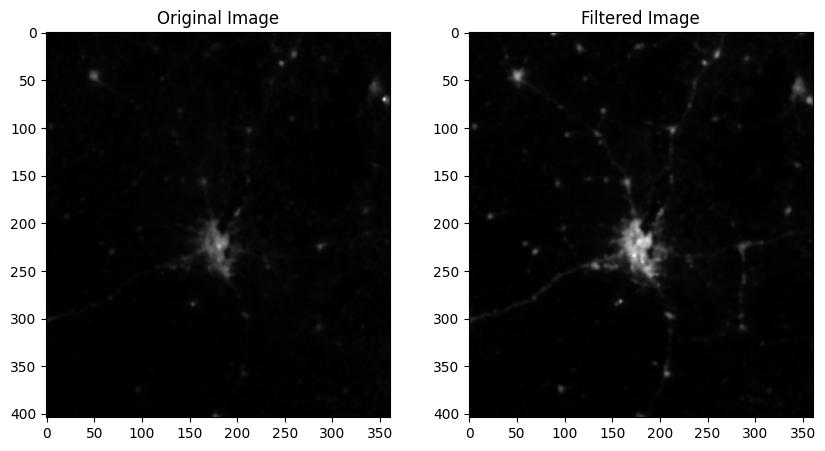

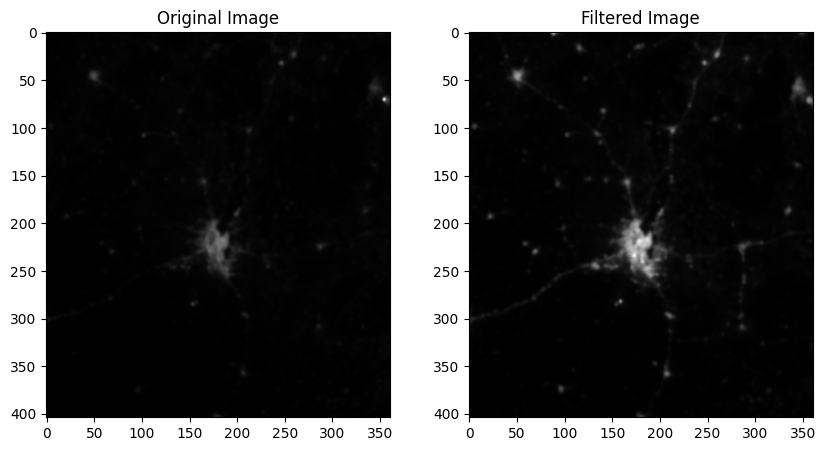

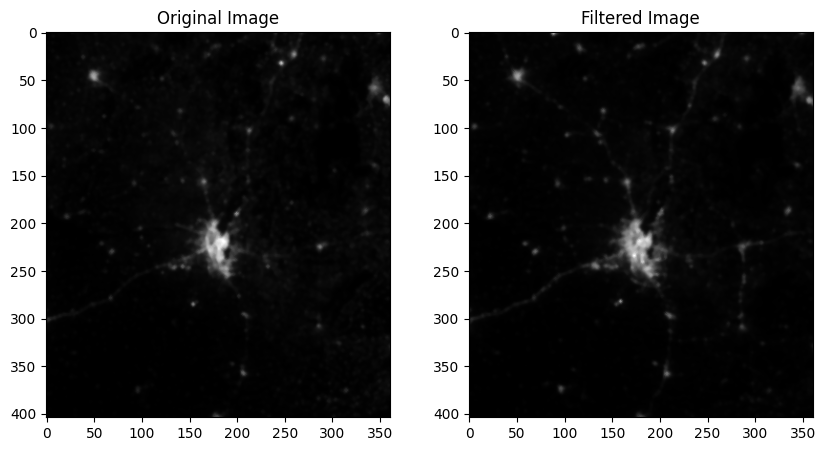

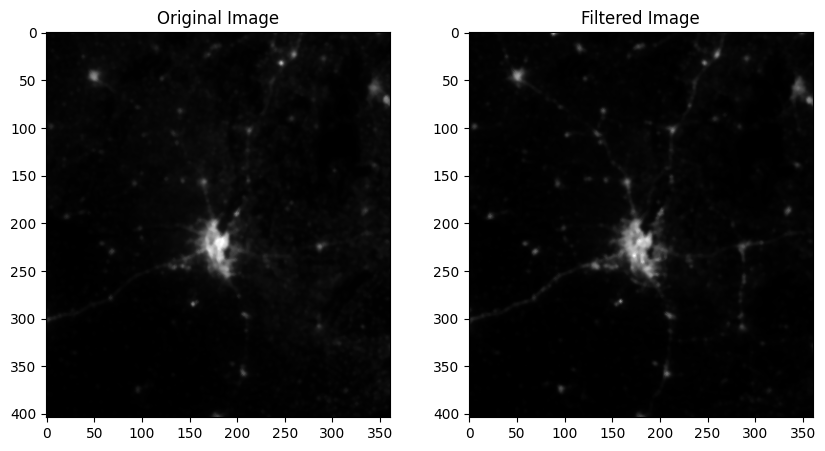

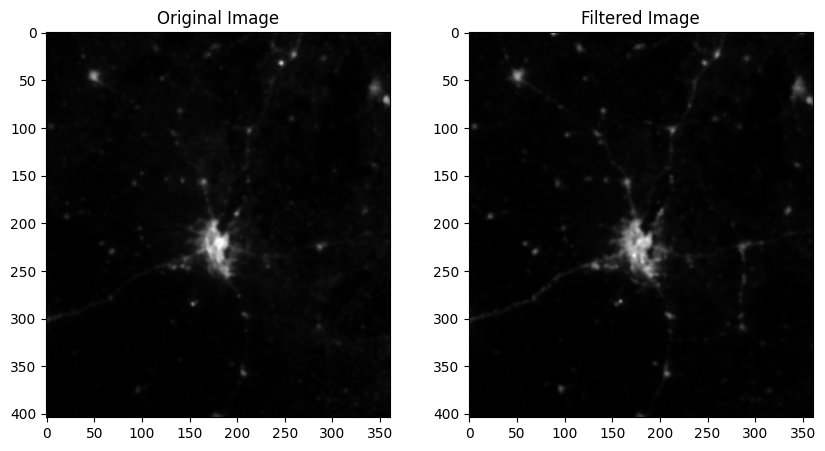

...

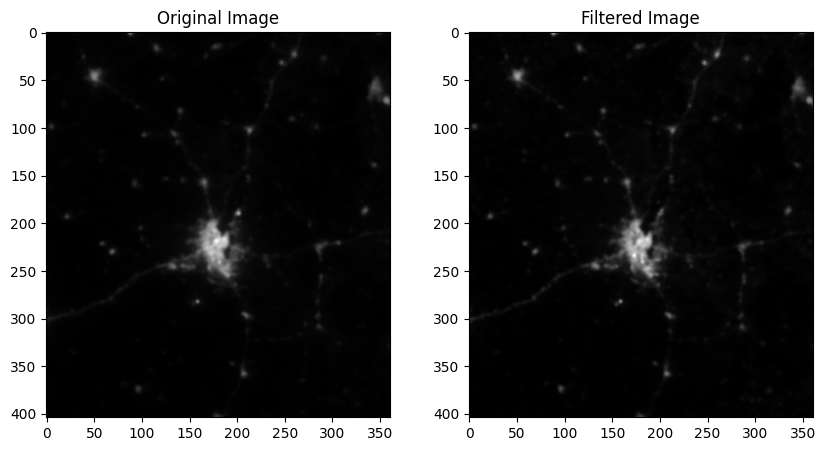

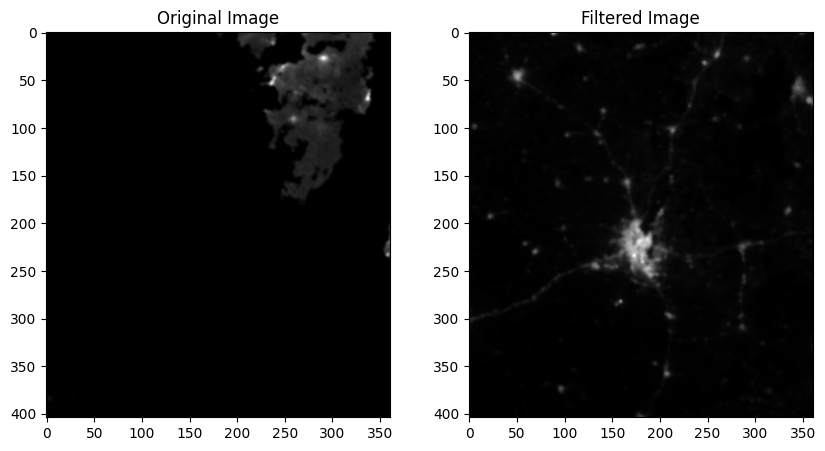

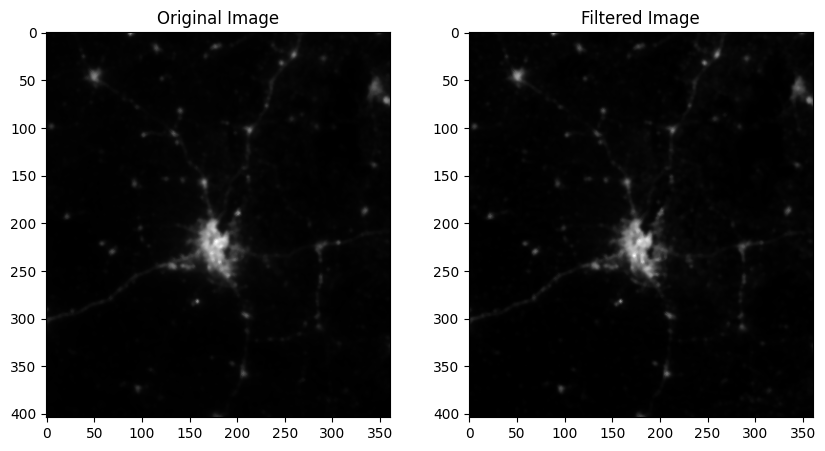

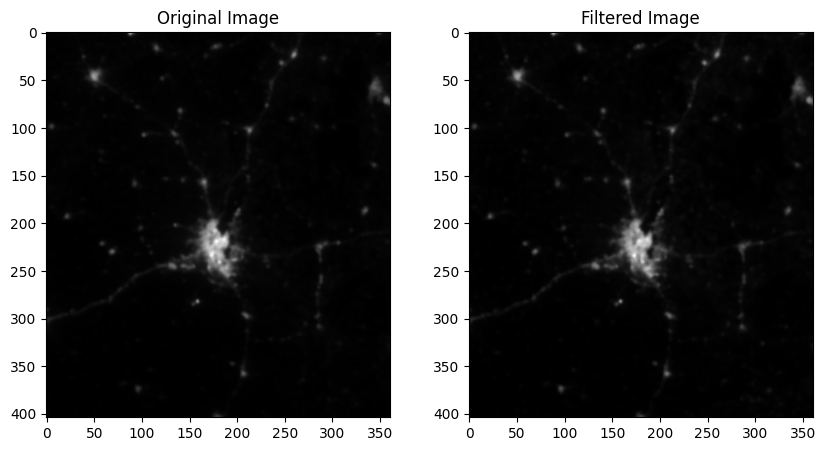

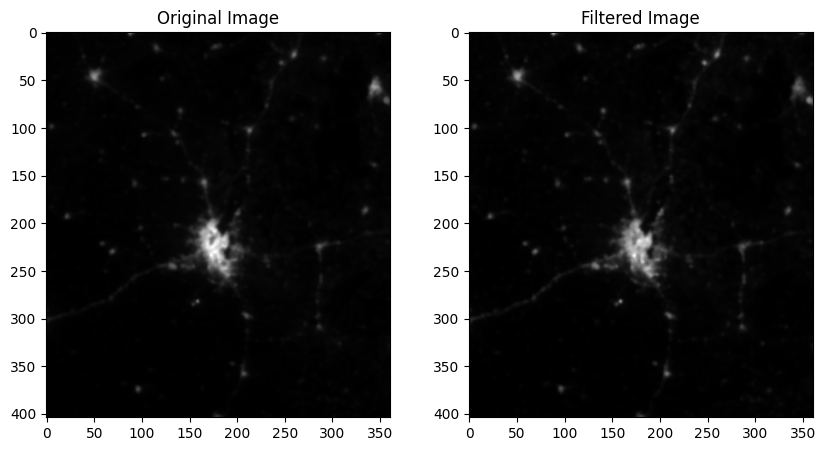

In [ ]:
import matplotlib.pyplot as plt

# plot original and filtered images
for i in range (0,94):
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    axs[0].imshow(preprocessed_data[i], cmap='gray')
    axs[0].set_title("Original Image")
    axs[1].imshow(filtered_image, cmap='gray')
    axs[1].set_title("Filtered Image")
plt.show()


In [ ]:
np.save("preprocessed_image_data.npy", preprocessed_data)

In [ ]:
import os

data_dir = '/content/data1'

# Get a list of file paths for all GeoTIFF images in the data directory
img_paths = []
for filename in os.listdir(data_dir):
    if filename.endswith('.tif'):
        img_paths.append(os.path.join(data_dir, filename))


In [ ]:
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array

def extract_features(img_path):
    # Load pre-trained ResNet50 model
    model = ResNet50(weights='imagenet', include_top=False, pooling='avg')
    
    # Load image and preprocess it
    img = load_img(img_path, target_size=(224, 224))
    x = img_to_array(img)
    x = preprocess_input(x)
    x = np.expand_dims(x, axis=0)
    
    # Extract features using ResNet50 model
    features = model.predict(x)
    
    return features.flatten()


In [ ]:
import numpy as np
from PIL import Image
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.applications import VGG16

model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
img_paths = glob.glob('/content/data1/*.tif')
features_list = []
for img_path in img_paths:
    img = Image.open(img_path)
    img = img.resize((224, 224))
    img = np.array(img)
    img = preprocess_input(img)
    img = np.expand_dims(img, axis=0)
    features = model.predict(img)
    features = np.array(features)
    features = features.flatten()
    features_list.append(features)

features_array = np.array(features_list)
np.save('image_features.npy', features_array)


58889256/58889256 [==============================] - 0s 0us/step


UnidentifiedImageError: ignored

In [ ]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

# Load preprocessed image data from file
image_data = np.load("preprocessed_image_data.npy")

# Define CNN model
model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=image_data.shape[1:]))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# Compile model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train model
model.fit(image_data, labels, epochs=10, validation_split=0.2)


ValueError: ignored

In [ ]:
import pandas as pd

energy_data = pd.read_csv('/content/energy_data.csv')

years = energy_data['Year'].tolist()
electricity_consumption = energy_data['Total Electricity Consumption (kWh)'].tolist()

print(years)
print(electricity_consumption)


[2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]
['2,16,40,64,000', '2,21,59,28,000', '2,26,90,16,000', '2,54,62,50,000', '2,82,27,32,000', '3,25,99,02,000', '3,44,88,48,000', '3,55,49,25,000', '3,82,18,53,000', '4,42,64,72,000', '4,62,65,91,000', '4,97,99,52,000', '5,34,36,39,000', '5,63,28,57,000']
